# FRANCE COVID-19 Data Analysis, Part 2: Demography.

## import packages


In [3]:
import requests
import pandas as pd 
import data
import download as download 
import preprocess
from preprocess.format_data import clean_gender,clean_age,format_age,remove_nan
from preprocess.utils_plot import df_plot_dec,df_plot_rea,df_plot_hosp,df_plot_gender

## import packages

In [2]:
data_age = pd.read_csv('data/AgeGroups.csv',sep=';')
data_gender = pd.read_csv('data/age_gender.csv',sep=';')

## Factor 1 : Age 

In [3]:
data_age.head(n=10)

,reg,cl_age90,jour,hosp,rea,HospConv,SSR_USLD,autres,rad,dc
0,1,0,2020-03-18,0,0,NaN,NaN,NaN,0,0
1,1,9,2020-03-18,0,0,NaN,NaN,NaN,0,0
2,1,19,2020-03-18,0,0,NaN,NaN,NaN,0,0
3,1,29,2020-03-18,0,0,NaN,NaN,NaN,0,0
4,1,39,2020-03-18,0,0,NaN,NaN,NaN,0,0
5,1,49,2020-03-18,0,0,NaN,NaN,NaN,0,0
6,1,59,2020-03-18,0,0,NaN,NaN,NaN,0,0
7,1,69,2020-03-18,0,0,NaN,NaN,NaN,0,0
8,1,79,2020-03-18,0,0,NaN,NaN,NaN,0,0
9,1,89,2020-03-18,0,0,NaN,NaN,NaN,0,0


## Variables descriptions : 

 - nb_hosp : number of patients hospitalized, 
  - nb-rea : number of people currently in intensive care or resuscitation, 
- nb_hospconv : number of persons currently in conventional hospitalization, 
- SSR_USLD: number of persons currently in Continuing and Rehabilitation Care (SSR) or Long-Term Care Units (USLD), 
- autres: number of persons currently hospitalized in another type of service, 
 - rad :cumulative number of persons returned home, 
 -  dc :cumulative number of deceased persons.


### We import functions for cleaning and preprocessing data

In [4]:
dfc = clean_age(data_age)

In [5]:
dfc1 = remove_nan(dfc)
dfC = format_age(dfc1)

In [6]:
def missing(df):
    print (round((df.isnull().sum() * 100/ len(df)),2).sort_values(ascending=False))


In [7]:
missing(dfC)

SSR_USLD       90.37
nb_hospconv    90.37
AgeGroup        0.00
dec_Tot         0.00
rad_Tot         0.00
nb-rea          0.00
nb_hosp         0.00
date            0.00
age             0.00
reg             0.00
dtype: float64


In [8]:
#dfC.to_csv(r'data/agegroups_cleaned.csv', index = False)

### We import functions that desplays charts :

Number of patients in instensive care per group age 

In [9]:
df_plot_rea(dfC)



Number of patients hospitalized per age group

In [10]:
df_plot_hosp(dfC)

Number of persons that died from coronavirus per group age 

In [11]:
df_plot_dec(dfC)


## Factor 2 : gender

In [50]:
data_gender.head(n=10)

,fra,week,P_f,P_h,P,pop_f,pop_h,cl_age90,pop
0,FR,2020-S21,64,56,125,3.802090e+06,3.961116e+06,9,7.763206e+06
1,FR,2020-S21,146,100,253,4.066327e+06,4.270159e+06,19,8.336486e+06
2,FR,2020-S21,306,247,556,3.736780e+06,3.740007e+06,29,7.476787e+06
3,FR,2020-S21,280,228,520,4.266384e+06,4.028988e+06,39,8.295372e+06
4,FR,2020-S21,315,256,574,4.355127e+06,4.237760e+06,49,8.592886e+06
5,FR,2020-S21,302,256,560,4.494308e+06,4.298366e+06,59,8.792675e+06
6,FR,2020-S21,189,220,412,4.209746e+06,3.794337e+06,69,8.004083e+06
7,FR,2020-S21,205,231,437,3.096658e+06,2.598981e+06,79,5.695639e+06
8,FR,2020-S21,447,225,672,1.993318e+06,1.251963e+06,89,3.245281e+06
9,FR,2020-S21,447,107,556,6.720700e+05,2.405106e+05,90,9.125806e+05


## Variables descriptions : 

In [ ]:
#to improve 

This dataset provides information at the national level. The incidence rate is the number of coronavirus positive cases per 100,000 population. It is calculated as follows: (100000 * number of positive cases) / Population. This rate is calculated from the results of virological tests.

the weekly incidence rate by age group and sex; the weekly standardized incidence rate; the sliding standardized incidence rate.



### Clean data and add group age column

In [6]:
df = clean_gender(data_gender)

In [7]:
df1 = format_age(df)

In [38]:
df_group = df1.groupby('AgeGroup')[['date','num_f','num_h','P']].aggregate(lambda x: x.mean())
df_group
df_group.reset_index(inplace=True)
df_group.head(n=10)

,AgeGroup,num_f,num_h,P
0,"[0,9]",28651.734043,25174.212766,54117.074468
1,"[10,19]",6748.510638,6735.872340,13665.574468
2,"[20,39]",9408.680851,8198.361702,17649.957447
3,"[30,39]",8846.255319,7409.191489,16287.361702
4,"[40,49]",8419.170213,7238.361702,15688.404255
5,"[50,59]",7447.808511,6788.787234,14263.212766
6,"[60,69]",4895.148936,4693.936170,9623.340426
7,"[70,79]",3051.574468,2907.638298,5967.787234
8,"[80,89]",2762.851064,1721.148936,4490.914894
9,"[90,+]",1875.340426,607.553191,2486.404255


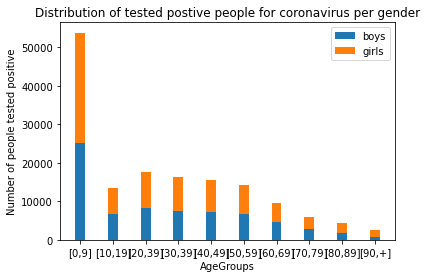

In [41]:
df_plot_gender(df_group)
